In [275]:
import numpy as np
import pandas as pd
import gc
import time
from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [276]:
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

In [277]:
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

In [278]:
# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('home_loan_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df
application_train_test()

Train samples: 307511, test samples: 48744


,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,0,1,0,1,0,0.067329,0.498036,202500.0,0.121978,0.060749
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,0,0,0,1,0,0.070862,0.208736,135000.0,0.132217,0.027598
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,0,0,0,0,0,0.011814,0.500000,67500.0,0.100000,0.050000
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0,0,0,0,0,0.159905,0.431748,67500.0,0.219900,0.094941
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,0,0,0,0,0,0.152418,0.236842,121500.0,0.179963,0.042623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,48739,456221,NaN,1,0,0,0,121500.0,412560.0,17473.5,...,0,0,0,0,0,0.258838,0.294503,121500.0,0.143815,0.042354
356251,48740,456222,NaN,1,0,1,2,157500.0,622413.0,31909.5,...,0,0,0,0,0,0.102718,0.253047,39375.0,0.202600,0.051267
356252,48741,456223,NaN,1,1,0,1,202500.0,315000.0,33205.5,...,0,1,0,1,0,0.190742,0.642857,67500.0,0.163978,0.105414
356253,48742,456224,NaN,0,0,1,0,225000.0,450000.0,25128.0,...,1,0,0,1,0,0.195518,0.500000,112500.0,0.111680,0.055840


In [279]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg
bureau_and_balance()

,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,...,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_SUM,CLOSED_AMT_ANNUITY_MAX,CLOSED_AMT_ANNUITY_MEAN,CLOSED_CNT_CREDIT_PROLONG_SUM,CLOSED_MONTHS_BALANCE_MIN_MIN,CLOSED_MONTHS_BALANCE_MAX_MAX,CLOSED_MONTHS_BALANCE_SIZE_MEAN,CLOSED_MONTHS_BALANCE_SIZE_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,-1572,-49,-735.000000,240043.666667,-1329.0,1778.0,82.428571,-93.142857,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-51.0,0.0,35.000000,140.0
100002,-1437,-103,-874.000000,186150.000000,-1072.0,780.0,-349.000000,-499.875000,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-47.0,0.0,15.000000,90.0
100003,-2586,-606,-1400.750000,827783.583333,-2434.0,1216.0,-544.500000,-816.000000,0,0.0,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0
100004,-1326,-408,-867.000000,421362.000000,-595.0,-382.0,-488.500000,-532.000000,0,0.0,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0
100005,-373,-62,-190.666667,26340.333333,-128.0,1324.0,439.333333,-54.333333,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-12.0,0.0,13.000000,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456249,-2713,-483,-1667.076923,407302.243590,-2499.0,1363.0,-1232.333333,-1064.538462,0,0.0,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0
456250,-1002,-760,-862.000000,15724.000000,-272.0,2340.0,1288.333333,-60.333333,0,0.0,...,0.0,0.0,0.0,384147.0,384147.0,0.0,-32.0,0.0,33.000000,33.0
456253,-919,-713,-867.500000,10609.000000,-189.0,1113.0,280.500000,-253.250000,0,0.0,...,0.0,0.0,0.0,58369.5,58369.5,0.0,-30.0,0.0,31.000000,62.0


In [280]:
# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg
previous_applications()

,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,...,REFUSED_HOUR_APPR_PROCESS_START_MAX,REFUSED_HOUR_APPR_PROCESS_START_MEAN,REFUSED_RATE_DOWN_PAYMENT_MIN,REFUSED_RATE_DOWN_PAYMENT_MAX,REFUSED_RATE_DOWN_PAYMENT_MEAN,REFUSED_DAYS_DECISION_MIN,REFUSED_DAYS_DECISION_MAX,REFUSED_DAYS_DECISION_MEAN,REFUSED_CNT_PAYMENT_MEAN,REFUSED_CNT_PAYMENT_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500,23787.0,23787.0,23787.00,1.044079,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000,179055.0,179055.0,179055.00,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500,68053.5,1035882.0,484191.00,0.868825,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000,20106.0,20106.0,20106.00,1.207699,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750,0.0,40153.5,20076.75,1.111173,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000,40455.0,40455.0,40455.00,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500,56821.5,56821.5,56821.50,1.013622,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750,13945.5,27306.0,20625.75,1.058833,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [281]:
# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
pos_cash()

,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_NAME_CONTRACT_STATUS_Active_MEAN,POS_NAME_CONTRACT_STATUS_Amortized debt_MEAN,POS_NAME_CONTRACT_STATUS_Approved_MEAN,POS_NAME_CONTRACT_STATUS_Canceled_MEAN,POS_NAME_CONTRACT_STATUS_Completed_MEAN,POS_NAME_CONTRACT_STATUS_Demand_MEAN,POS_NAME_CONTRACT_STATUS_Returned to the store_MEAN,POS_NAME_CONTRACT_STATUS_Signed_MEAN,POS_NAME_CONTRACT_STATUS_XNA_MEAN,POS_NAME_CONTRACT_STATUS_nan_MEAN,POS_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,
100001,-53,-72.555556,9,7,0.777778,7,0.777778,0.777778,0.0,0.0,0.0,0.222222,0.0,0.0,0.000000,0.0,0.0,9
100002,-1,-10.000000,19,0,0.000000,0,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,19
100003,-18,-43.785714,28,0,0.000000,0,0.000000,0.928571,0.0,0.0,0.0,0.071429,0.0,0.0,0.000000,0.0,0.0,28
100004,-24,-25.500000,4,0,0.000000,0,0.000000,0.750000,0.0,0.0,0.0,0.250000,0.0,0.0,0.000000,0.0,0.0,4
100005,-15,-20.000000,11,0,0.000000,0,0.000000,0.818182,0.0,0.0,0.0,0.090909,0.0,0.0,0.090909,0.0,0.0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,-1,-5.000000,9,0,0.000000,0,0.000000,0.777778,0.0,0.0,0.0,0.111111,0.0,0.0,0.111111,0.0,0.0,9
456252,-76,-79.000000,7,0,0.000000,0,0.000000,0.857143,0.0,0.0,0.0,0.142857,0.0,0.0,0.000000,0.0,0.0,7
456253,-57,-79.235294,17,5,0.294118,5,0.294118,0.882353,0.0,0.0,0.0,0.117647,0.0,0.0,0.000000,0.0,0.0,17


In [282]:
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg
installments_payments()

,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,2,11.0,1.571429,11.0,36.0,8.857143,62.0,1.00000,1.000000,7.000000,...,5885.132143,41195.925,3951.000,17397.900,5885.132143,41195.925,-1628.0,-2195.000000,-15365.0,7
100002,2,0.0,0.000000,0.0,31.0,20.421053,388.0,1.00000,1.000000,19.000000,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19
100003,2,0.0,0.000000,0.0,14.0,7.160000,179.0,1.00000,1.000000,25.000000,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25
100004,2,0.0,0.000000,0.0,11.0,7.666667,23.0,1.00000,1.000000,3.000000,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3
100005,2,1.0,0.111111,1.0,37.0,23.666667,213.0,1.00000,1.000000,9.000000,...,6240.205000,56161.845,4813.200,17656.245,6240.205000,56161.845,-470.0,-609.555556,-5486.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,2,0.0,0.000000,0.0,46.0,36.285714,254.0,1.00000,1.000000,7.000000,...,7492.924286,52450.470,6605.910,12815.010,7492.924286,52450.470,-38.0,-156.285714,-1094.0,7
456252,1,3.0,0.500000,3.0,11.0,3.333333,20.0,1.00000,1.000000,6.000000,...,10069.867500,60419.205,10046.880,10074.465,10069.867500,60419.205,-2327.0,-2393.833333,-14363.0,6
456253,1,9.0,0.642857,9.0,51.0,15.142857,212.0,1.00000,0.928571,13.000000,...,4399.707857,61595.910,27.270,5575.185,4115.915357,57622.815,-1738.0,-2387.428571,-33424.0,14


In [283]:
# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg
credit_card_balance()

,CC_MONTHS_BALANCE_MIN,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SUM,CC_MONTHS_BALANCE_VAR,CC_AMT_BALANCE_MIN,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_BALANCE_SUM,CC_AMT_BALANCE_VAR,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100006,-6,-1,-3.5,-21,3.5,0.000,0.000,0.000000,0.000,0.000000e+00,...,0,0.0,0,0.0,0,0,0.0,0,0.0,6
100011,-75,-2,-38.5,-2849,462.5,0.000,189000.000,54482.111149,4031676.225,4.641321e+09,...,0,0.0,0,0.0,0,0,0.0,0,0.0,74
100013,-96,-1,-48.5,-4656,776.0,0.000,161420.220,18159.919219,1743352.245,1.869473e+09,...,0,0.0,0,0.0,0,0,0.0,0,0.0,96
100021,-18,-2,-10.0,-170,25.5,0.000,0.000,0.000000,0.000,0.000000e+00,...,0,0.0,0,0.0,0,0,0.0,0,0.0,17
100023,-11,-4,-7.5,-60,6.0,0.000,0.000,0.000000,0.000,0.000000e+00,...,0,0.0,0,0.0,0,0,0.0,0,0.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456244,-41,-1,-21.0,-861,143.5,0.000,453627.675,131834.730732,5405223.960,3.295703e+10,...,0,0.0,0,0.0,0,0,0.0,0,0.0,41
456246,-9,-2,-5.5,-44,6.0,0.000,43490.115,13136.731875,105093.855,3.335511e+08,...,0,0.0,0,0.0,0,0,0.0,0,0.0,8
456247,-96,-2,-49.0,-4655,760.0,0.000,190202.130,23216.396211,2205557.640,3.200871e+09,...,0,0.0,0,0.0,0,0,0.0,0,0.0,95


In [284]:
df = application_train_test()
df.head()

Train samples: 307511, test samples: 48744


,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,0,1,0,1,0,0.067329,0.498036,202500.0,0.121978,0.060749
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,0,0,0,1,0,0.070862,0.208736,135000.0,0.132217,0.027598
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,0,0,0,0,0,0.011814,0.500000,67500.0,0.100000,0.050000
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0,0,0,0,0,0.159905,0.431748,67500.0,0.219900,0.094941
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,0,0,0,0,0,0.152418,0.236842,121500.0,0.179963,0.042623


In [285]:
df.shape

(356251, 248)

In [286]:
bureau = bureau_and_balance()
print("Bureau df shape:", bureau.shape)
df = df.join(bureau, how='left', on='SK_ID_CURR')
del bureau
gc.collect()
df.head()

Bureau df shape: (305811, 116)


,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_SUM,CLOSED_AMT_ANNUITY_MAX,CLOSED_AMT_ANNUITY_MEAN,CLOSED_CNT_CREDIT_PROLONG_SUM,CLOSED_MONTHS_BALANCE_MIN_MIN,CLOSED_MONTHS_BALANCE_MAX_MAX,CLOSED_MONTHS_BALANCE_SIZE_MEAN,CLOSED_MONTHS_BALANCE_SIZE_SUM
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,0.0,0.0,0.0,0.0,0.0,0.0,-47.0,0.0,15.0,90.0
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0


In [287]:
prev = previous_applications()
print("Previous applications df shape:", prev.shape)
df = df.join(prev, how='left', on='SK_ID_CURR')
del prev
gc.collect()
df.head()

Previous applications df shape: (338857, 249)


,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,REFUSED_HOUR_APPR_PROCESS_START_MAX,REFUSED_HOUR_APPR_PROCESS_START_MEAN,REFUSED_RATE_DOWN_PAYMENT_MIN,REFUSED_RATE_DOWN_PAYMENT_MAX,REFUSED_RATE_DOWN_PAYMENT_MEAN,REFUSED_DAYS_DECISION_MIN,REFUSED_DAYS_DECISION_MAX,REFUSED_DAYS_DECISION_MEAN,REFUSED_CNT_PAYMENT_MEAN,REFUSED_CNT_PAYMENT_SUM
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,15.0,15.0,NaN,NaN,NaN,-181.0,-181.0,-181.0,48.0,48.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [288]:
pos = pos_cash()
print("Pos-cash balance df shape:", pos.shape)
df = df.join(pos, how='left', on='SK_ID_CURR')
del pos
gc.collect()
df.head()

Pos-cash balance df shape: (337252, 18)


,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,POS_NAME_CONTRACT_STATUS_Amortized debt_MEAN,POS_NAME_CONTRACT_STATUS_Approved_MEAN,POS_NAME_CONTRACT_STATUS_Canceled_MEAN,POS_NAME_CONTRACT_STATUS_Completed_MEAN,POS_NAME_CONTRACT_STATUS_Demand_MEAN,POS_NAME_CONTRACT_STATUS_Returned to the store_MEAN,POS_NAME_CONTRACT_STATUS_Signed_MEAN,POS_NAME_CONTRACT_STATUS_XNA_MEAN,POS_NAME_CONTRACT_STATUS_nan_MEAN,POS_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,19.0
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,0.071429,0.0,0.000000,0.000000,0.0,0.0,28.0
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.250000,0.0,0.000000,0.000000,0.0,0.0,4.0
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.095238,0.0,0.047619,0.000000,0.0,0.0,21.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.045455,0.0,0.000000,0.015152,0.0,0.0,66.0


In [289]:
ins = installments_payments()
print("Installments payments df shape:", ins.shape)
df = df.join(ins, how='left', on='SK_ID_CURR')
del ins
gc.collect()
df.head()

Installments payments df shape: (339587, 26)


,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19.0
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25.0
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3.0
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,-12.0,-271.625000,-4346.0,16.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,-14.0,-1032.242424,-68128.0,66.0


In [290]:
import re
cc = credit_card_balance()
print("Credit card balance df shape:", cc.shape)
df = df.join(cc, how='left', on='SK_ID_CURR')
del cc
gc.collect()


Credit card balance df shape: (103558, 141)


0

In [291]:
df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
df.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [292]:
df.columns

Index(['index', 'SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY',
       ...
       'CC_NAME_CONTRACT_STATUS_Signed_MAX',
       'CC_NAME_CONTRACT_STATUS_Signed_MEAN',
       'CC_NAME_CONTRACT_STATUS_Signed_SUM',
       'CC_NAME_CONTRACT_STATUS_Signed_VAR', 'CC_NAME_CONTRACT_STATUS_nan_MIN',
       'CC_NAME_CONTRACT_STATUS_nan_MAX', 'CC_NAME_CONTRACT_STATUS_nan_MEAN',
       'CC_NAME_CONTRACT_STATUS_nan_SUM', 'CC_NAME_CONTRACT_STATUS_nan_VAR',
       'CC_COUNT'],
      dtype='object', length=798)

In [293]:
df.shape

(356251, 798)

In [294]:
X_train = pd.read_csv('application_train.csv')

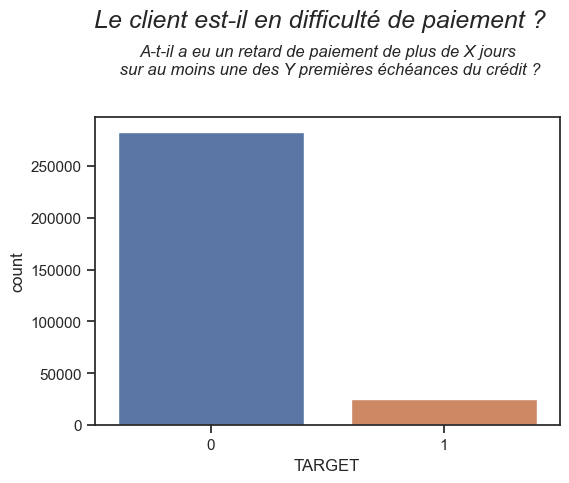

In [241]:

colors = ['#d4b3ac']

loan_map = {1 : "Oui",
            0 : "Non"}

fig, ax = plt.subplots(figsize=(6, 4))
sns.countplot(x ='TARGET', data = X_train)


plt.suptitle("Le client est-il en difficulté de paiement ?\n",
             y=1.15, fontsize=18, fontstyle='italic')
plt.title("A-t-il a eu un retard de paiement de plus de X jours\n sur au moins une des Y premières échéances du crédit ?\n\n",
           loc="center", fontsize=12, fontstyle='italic')
plt.show()

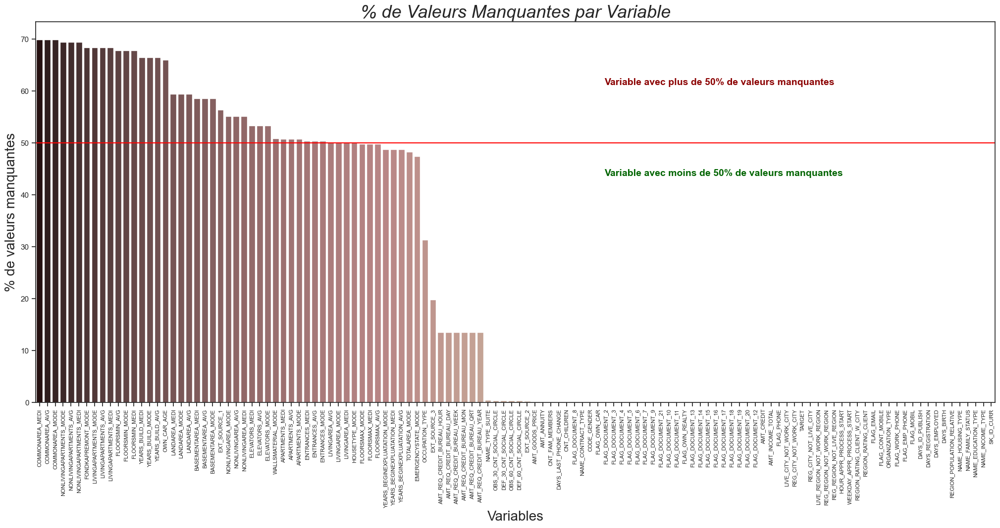

In [213]:
sns.set(style="ticks", rc = {'figure.figsize':(25,10)}, palette= "pink")
thresh_na = 50

ax = plt.subplot(1,1,1)
perc = (X_train.isnull().sum()/X_train.shape[0])*100
perc = perc.sort_values(ascending=False)

ax = sns.barplot(x = X_train.columns, y = perc, palette = "pink")

plt.axhline(y = thresh_na, color = 'r', linestyle = '-')

plt.text(len(X_train.isnull().sum()/len(X_train))/1.7, 
         thresh_na+12.5, 'Variable avec plus de %s%s de valeurs manquantes' %(thresh_na, '%'), 
         fontsize = 14, weight = 'bold', color = 'darkred', ha = 'left' , va = 'top')

plt.text(len(X_train.isnull().sum()/len(X_train))/1.7, 
         thresh_na - 5, 'Variable avec moins de %s%s de valeurs manquantes' %(thresh_na, '%'), 
         fontsize = 14, weight = 'bold', color = 'darkgreen', ha = 'left' , va = 'top')

ax.set_title('% de Valeurs Manquantes par Variable', loc="center", fontsize = 26, fontstyle='italic')
ax.set_xlabel('Variables', fontsize = 20)
ax.set_ylabel('% de valeurs manquantes', fontsize = 20)
ax.set_xticklabels(perc.index, rotation = 90, fontsize = 8)

plt.show()


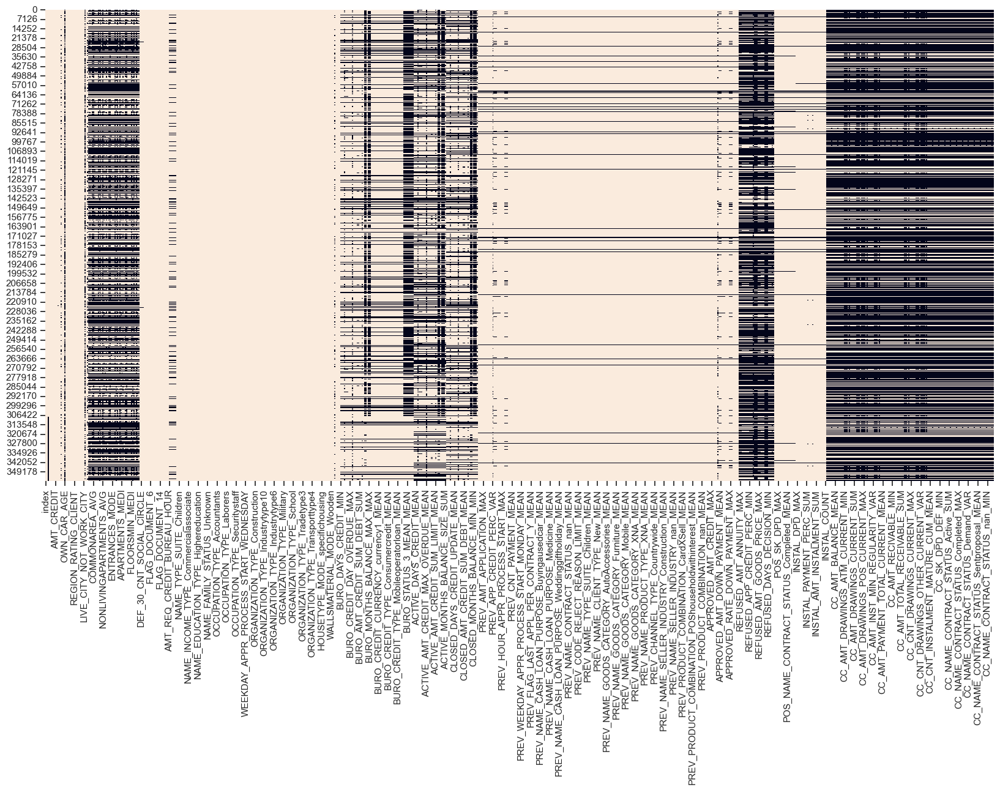

In [236]:
plt.figure(figsize=(20,10))
sns.heatmap(df.notna(), cbar=False)
plt.show()

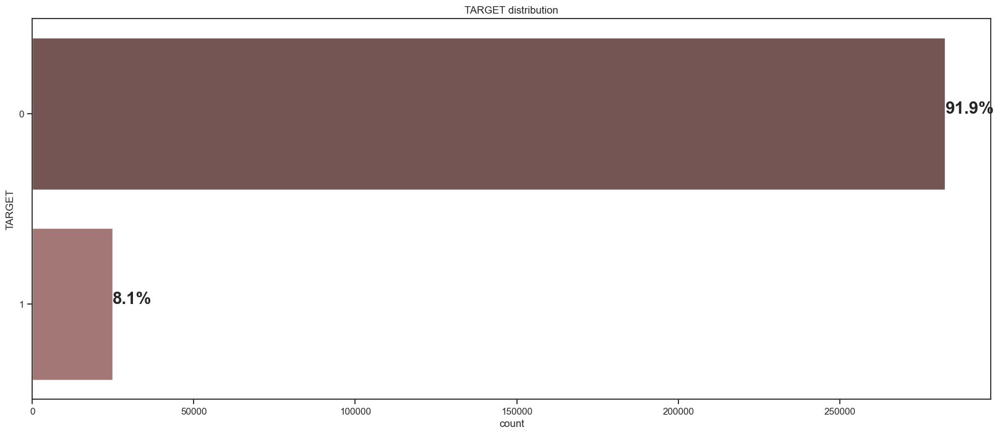

In [238]:
ax, fig = plt.subplots(figsize=(20,8)) 
ax = sns.countplot(y='TARGET', data=X_train)
ax.set_title("TARGET distribution")

for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/len(X_train.TARGET))
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y), fontsize=20, fontweight='bold')
        
plt.show()

In [295]:
threshold = 0.5 * df.shape[0]

data = df.dropna(axis=1, thresh=threshold)


In [296]:
df_1=df.sample(10000)

In [297]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')
df_1.iloc[:,:] = imputer.fit_transform(df_1)

In [298]:
df_1.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
351772,44261.0,423681.0,0.0,1.0,0.0,0.0,2.0,202500.0,481176.0,24696.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0
219830,219830.0,354670.0,0.0,1.0,0.0,1.0,0.0,76500.0,157500.0,7875.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0
35129,35129.0,140694.0,0.0,0.0,1.0,1.0,0.0,225000.0,450000.0,23692.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0
39643,39643.0,145897.0,0.0,1.0,0.0,1.0,0.0,112500.0,688500.0,31243.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0
85939,85939.0,199721.0,0.0,1.0,0.0,0.0,0.0,135000.0,194922.0,15084.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0


In [299]:
from sklearn.model_selection import train_test_split
feat = [f for f in df_1.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
X=df_1[feat]
Y= df_1["TARGET"]
X_train, X_test, y_train, y_test = train_test_split(
X,Y, test_size=0.3, random_state=42)

In [300]:
X_train.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
101714,1.0,0.0,0.0,0.0,135000.0,666090.0,43713.0,666090.0,0.018209,-20312.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0
295725,1.0,1.0,0.0,0.0,81000.0,1350000.0,39474.0,1350000.0,0.018850,-15529.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0
266714,0.0,1.0,1.0,3.0,225000.0,348264.0,37638.0,315000.0,0.010643,-11356.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,82.0
216093,0.0,0.0,0.0,0.0,90000.0,299772.0,19287.0,247500.0,0.018801,-23985.0,...,1.0,0.1,1.0,0.1,0.0,0.0,0.0,0.0,0.0,10.0
237447,1.0,0.0,1.0,0.0,225000.0,2013840.0,55507.5,1800000.0,0.035792,-18161.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0


In [301]:
rtr=  LGBMClassifier(n_estimators=500,learning_rate=0.29734997673606356,
max_depth=11, num_leaves=11, min_data_in_leaf= 200,
min_child_samples=98, lambda_l1=0.9037886944882865,
lambda_l2= 0.011906183063897397, min_gain_to_split= 0.007551036778260303,
feature_fraction= 0.9658507086246584,
bagging_fraction= 0.8476232920140797,
bagging_freq=7, colsample_bytree= 0.3)

In [178]:
#rtr=  LGBMClassifier(colsample_bytree=0.4, is_unbalance=True, learning_rate=0.05,
               # max_depth=11, min_child_samples=500, min_child_weight=100.0,
               # n_jobs=-2, num_leaves=20, objective='binary', random_state=101,
                #reg_alpha=50, reg_lambda=1, subsample=0.8, verbose=-1)

In [302]:
 rtr.fit(X_train,y_train)

[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] lambda_l2 is set=0.011906183063897397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011906183063897397
[LightGBM] [Warning] feature_fraction is set=0.9658507086246584, colsample_bytree=0.3 will be ignored. Current value: feature_fraction=0.9658507086246584
[LightGBM] [Warning] bagging_fraction is set=0.8476232920140797, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8476232920140797
[LightGBM] [Warning] min_gain_to_split is set=0.007551036778260303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007551036778260303
[LightGBM] [Warning] lambda_l1 is set=0.9037886944882865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9037886944882865


LGBMClassifier(bagging_fraction=0.8476232920140797, bagging_freq=7,
               colsample_bytree=0.3, feature_fraction=0.9658507086246584,
               lambda_l1=0.9037886944882865, lambda_l2=0.011906183063897397,
               learning_rate=0.29734997673606356, max_depth=11,
               min_child_samples=98, min_data_in_leaf=200,
               min_gain_to_split=0.007551036778260303, n_estimators=500,
               num_leaves=11)

In [303]:
# Sauvegarde du modèle
import pickle

pickle.dump(rtr, open('model_LGBM.pkl', 'wb'))

In [304]:
# importance des variables
coef_imp_feature = pd.DataFrame({'variable': X_train.columns,
                                 'coef': rtr.feature_importances_})
print(coef_imp_feature.sort_values(by='coef', ascending=False))

              variable  coef
9           DAYS_BIRTH    64
12     DAYS_ID_PUBLISH    59
11   DAYS_REGISTRATION    57
31        EXT_SOURCE_2    57
32        EXT_SOURCE_3    39
..                 ...   ...
91    FLAG_DOCUMENT_12     0
92    FLAG_DOCUMENT_13     0
93    FLAG_DOCUMENT_14     0
94    FLAG_DOCUMENT_15     0
794           CC_COUNT     0

[795 rows x 2 columns]


In [305]:
# Make predictions
y_pred_lgbm = rtr.predict(X_test)

y_pred_lgbm_df = pd.DataFrame(y_pred_lgbm, columns=['y_pred_test'])

In [306]:
print("Prédictions sur l'ensemble de test")
print(pd.DataFrame({
    "COUNT": y_pred_lgbm_df.value_counts(),
    "RATIO": y_pred_lgbm_df.value_counts() / len(y_pred_lgbm_df) * 100}))

Prédictions sur l'ensemble de test
             COUNT  RATIO
y_pred_test              
0.0           2970   99.0
1.0             30    1.0


In [307]:
y_pred_lgbm_proba =rtr.predict_proba(X_test)

y_pred_lgbm_proba

array([[9.82255972e-01, 1.77440283e-02],
       [9.99591891e-01, 4.08108585e-04],
       [9.99334094e-01, 6.65906235e-04],
       ...,
       [9.89865605e-01, 1.01343946e-02],
       [9.91076669e-01, 8.92333145e-03],
       [9.99062521e-01, 9.37478990e-04]])

In [308]:
y_pred_lgbm_proba_df = pd.DataFrame(y_pred_lgbm_proba, columns=['proba_classe_0', 'proba_classe_1'])


In [309]:
y_pred_lgbm_proba_df[y_pred_lgbm_proba_df['proba_classe_1'] > 0.8].sort_values(by='proba_classe_1', ascending=False)


,proba_classe_0,proba_classe_1
1479,0.017509,0.982491
1808,0.041656,0.958344
1871,0.079593,0.920407
2960,0.082109,0.917891
42,0.104363,0.895637
1899,0.111035,0.888965
2766,0.175135,0.824865


In [310]:
shap_values_lgbm =  rtr.predict(X_test, pred_contrib=True)

shap_values_lgbm

array([[-0.26421499,  0.05282914,  0.00607928, ...,  0.        ,
         0.        , -5.81536826],
       [-0.15610612, -0.12321013,  0.00891859, ...,  0.        ,
         0.        , -5.81536826],
       [ 0.17963682, -0.20431431,  0.00607928, ...,  0.        ,
         0.        , -5.81536826],
       ...,
       [-0.16048028,  0.13856407,  0.02639728, ...,  0.        ,
         0.        , -5.81536826],
       [-0.117578  ,  0.20182507,  0.02639728, ...,  0.        ,
         0.        , -5.81536826],
       [-0.29955761, -0.33746076,  0.00891859, ...,  0.        ,
         0.        , -5.81536826]])

In [312]:
import shap
shap.initjs()

In [313]:
shap.__version__

'0.40.0'

In [314]:
explainer = shap.TreeExplainer(rtr)
shap_values_all = explainer(X_test)

In [315]:
shap_values_all


.values =
array([[[ 0.26421499, -0.26421499],
        [-0.05282914,  0.05282914],
        [-0.00607928,  0.00607928],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       [[ 0.15610612, -0.15610612],
        [ 0.12321013, -0.12321013],
        [-0.00891859,  0.00891859],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       [[-0.17963682,  0.17963682],
        [ 0.20431431, -0.20431431],
        [-0.00607928,  0.00607928],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       ...,

       [[ 0.16048028, -0.16048028],
        [-0.13856407,  0.13856407],
        [-0.02639728,  0.02639728],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       [[ 0.117578  , -0.117578  ],
        [-0.20182

La variable shap_values a trois attributs : .values, .base_values et .data.

L' .data attribut est simplement une copie des données d'entrée, .base_values est la valeur attendue de la cible, ou la valeur cible moyenne de toutes les données de train, et .values sont les valeurs SHAP pour chaque exemple.

In [316]:
shap_values = explainer.shap_values(X_test)

# Shap_values pour la classe 0 et la classe 1
shap_values

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


[array([[ 0.26421499, -0.05282914, -0.00607928, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.15610612,  0.12321013, -0.00891859, ...,  0.        ,
          0.        ,  0.        ],
        [-0.17963682,  0.20431431, -0.00607928, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.16048028, -0.13856407, -0.02639728, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.117578  , -0.20182507, -0.02639728, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.29955761,  0.33746076, -0.00891859, ...,  0.        ,
          0.        ,  0.        ]]),
 array([[-0.26421499,  0.05282914,  0.00607928, ...,  0.        ,
          0.        ,  0.        ],
        [-0.15610612, -0.12321013,  0.00891859, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.17963682, -0.20431431,  0.00607928, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [-0.16048028,  0.13856407,  0.02639728, ...,  

In [317]:
# Shap_values uniquement pour la classe 1
shap_values[1]

array([[-0.26421499,  0.05282914,  0.00607928, ...,  0.        ,
         0.        ,  0.        ],
       [-0.15610612, -0.12321013,  0.00891859, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.17963682, -0.20431431,  0.00607928, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-0.16048028,  0.13856407,  0.02639728, ...,  0.        ,
         0.        ,  0.        ],
       [-0.117578  ,  0.20182507,  0.02639728, ...,  0.        ,
         0.        ,  0.        ],
       [-0.29955761, -0.33746076,  0.00891859, ...,  0.        ,
         0.        ,  0.        ]])

In [318]:
shap_values_df = pd.DataFrame(data=shap_values[1], columns=X_test.columns)
shap_values_df.shape

(3000, 795)

In [319]:
shap_values_df.head()


,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,-0.264215,0.052829,0.006079,0.0,-0.015743,0.003288,-0.153868,-0.095120,-0.064825,0.147923,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.156106,-0.123210,0.008919,0.0,0.074767,0.068695,0.257197,0.016729,-0.276163,0.063186,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.179637,-0.204314,0.006079,0.0,0.125953,-0.020234,0.225978,-0.027190,-0.289653,0.488408,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.217522,0.110793,0.003480,0.0,0.005501,-0.051942,-0.027006,0.152193,-0.123689,-0.223365,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.254080,0.099529,0.008919,0.0,-0.011724,-0.229331,-0.102116,0.015932,-0.118583,-0.002485,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [320]:
print(f"Moyenne des valeurs absolues des valeurs de Shap :\n{shap_values_df.abs().mean().sort_values(ascending=False)}")


Moyenne des valeurs absolues des valeurs de Shap :
EXT_SOURCE_3                                               0.397243
EXT_SOURCE_2                                               0.367882
CODE_GENDER                                                0.283612
PAYMENT_RATE                                               0.243341
DAYS_ID_PUBLISH                                            0.233790
                                                             ...   
PREV_NAME_CASH_LOAN_PURPOSE_Buyinganewcar_MEAN             0.000000
PREV_NAME_CASH_LOAN_PURPOSE_Buyingahome_MEAN               0.000000
PREV_NAME_CASH_LOAN_PURPOSE_Buyingaholidayhomeland_MEAN    0.000000
PREV_NAME_CASH_LOAN_PURPOSE_Buyingagarage_MEAN             0.000000
CC_COUNT                                                   0.000000
Length: 795, dtype: float64


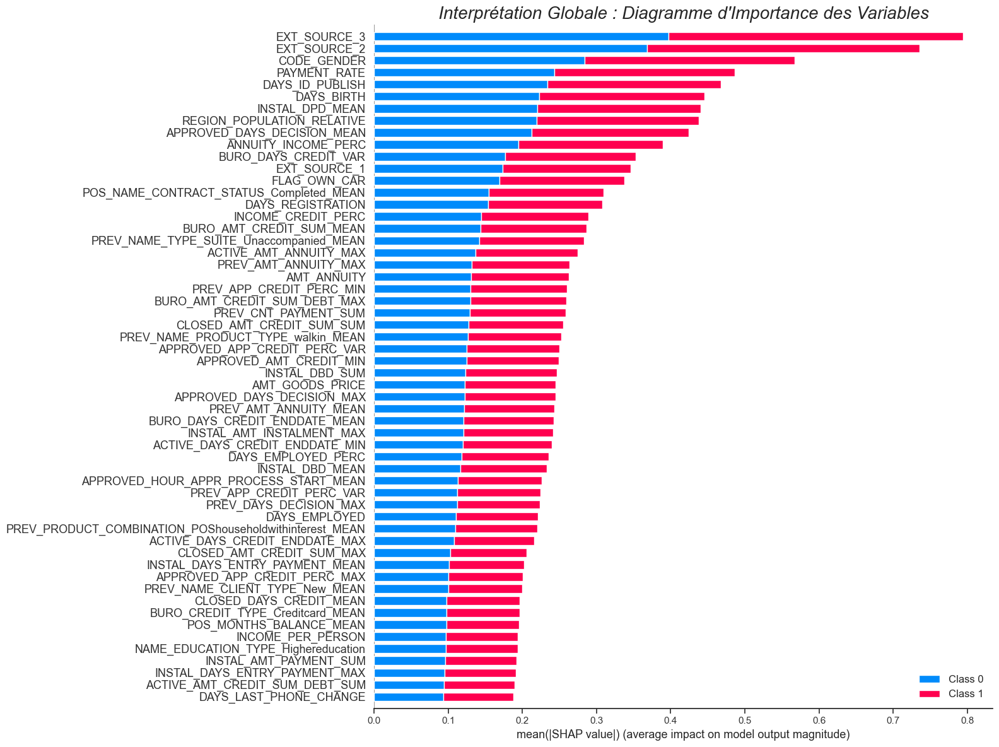

In [321]:
# visualize the impact of each features

shap.summary_plot(shap_values, 
                  feature_names=X_test.columns,
                  plot_size=(16, 12),
                  plot_type="bar",
                  max_display=56,
                  show = False)
plt.title("Interprétation Globale : Diagramme d'Importance des Variables", fontsize=20, fontstyle='italic')
plt.tight_layout()
plt.show()

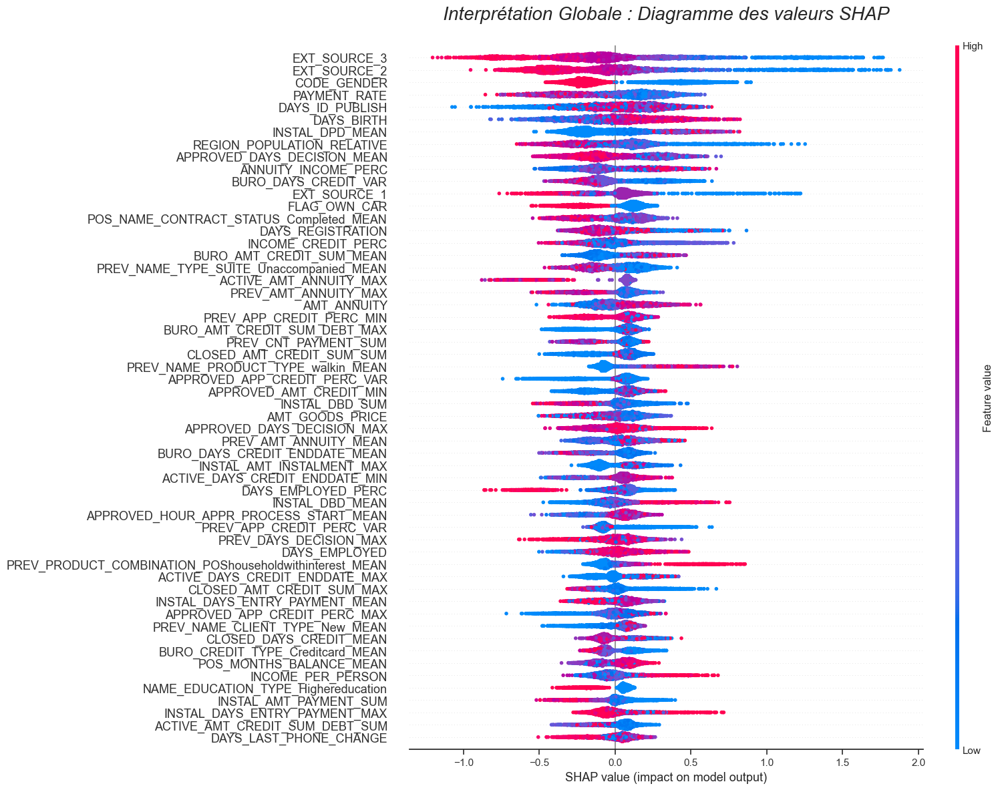

In [322]:
# print the JS visualization code to the notebook
shap.initjs()

shap.summary_plot(shap_values[1], 
                  features=X_test,
                  feature_names=X_test.columns,
                  plot_size=(16, 12),
                  plot_type="dot",
                  max_display=56,
                  show = False)
plt.title("Interprétation Globale : Diagramme des valeurs SHAP\n", 
          fontsize=20, fontstyle='italic')
plt.tight_layout()
plt.show()

In [323]:
explainer = shap.Explainer(rtr)
shap_test = explainer(X_test)

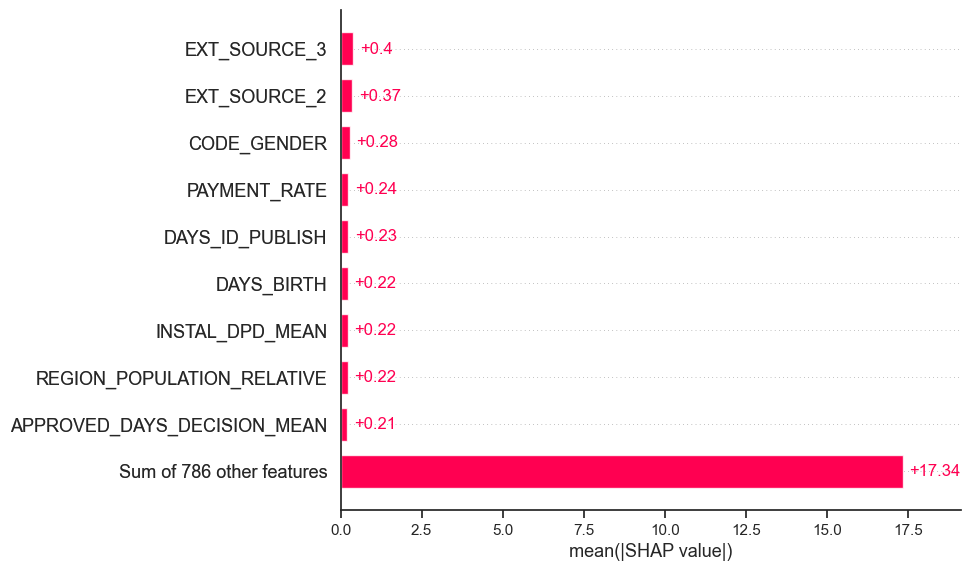

In [324]:
# Global | Bar plot: Let’s check out features’ overall contribution to predicting the positive class:
shap.plots.bar(shap_test[:,:,1])

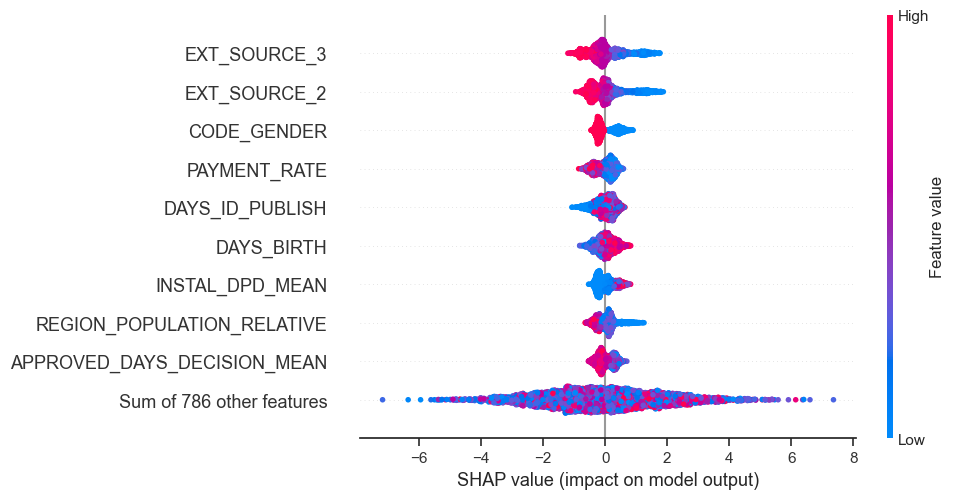

In [325]:
shap.plots.beeswarm(shap_test[:,:,1])

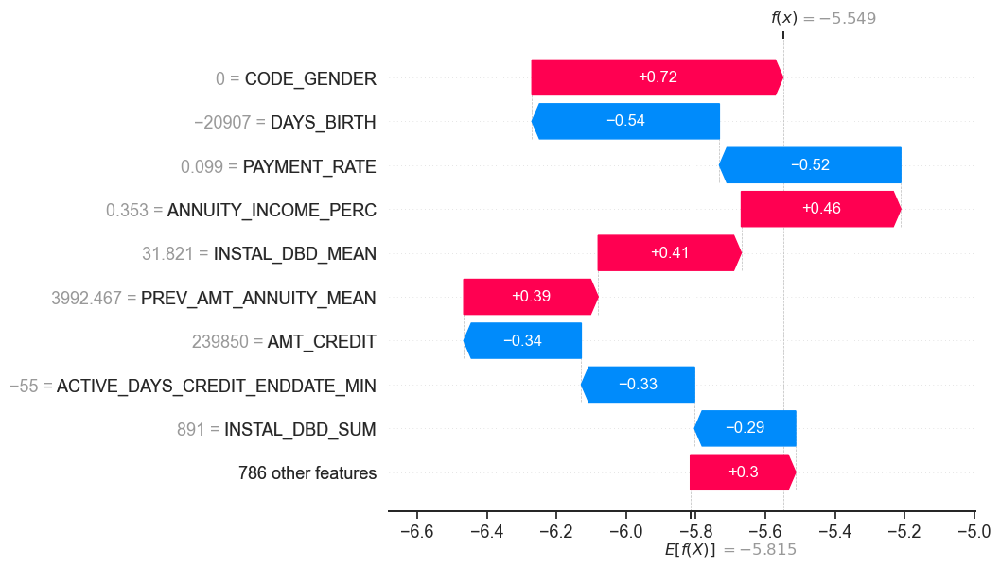

In [326]:
shap.plots.waterfall(shap_test[:,:,1][5])

In [327]:
explainer = shap.TreeExplainer(rtr, X_train, model_output="probability")
shap_test = explainer(X_test)

100%|===================| 2985/3000 [00:24<00:00]        

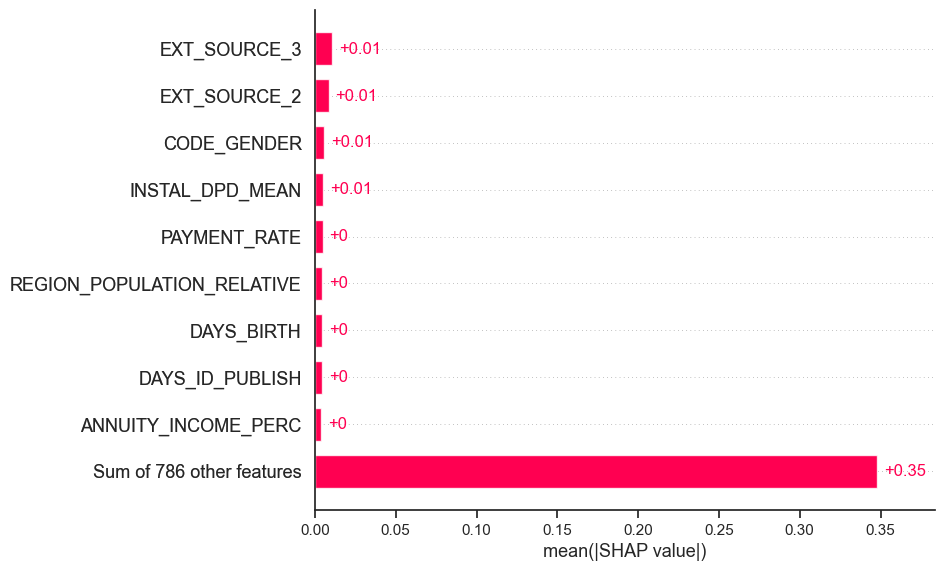

In [328]:
shap.plots.bar(shap_test[:,:])

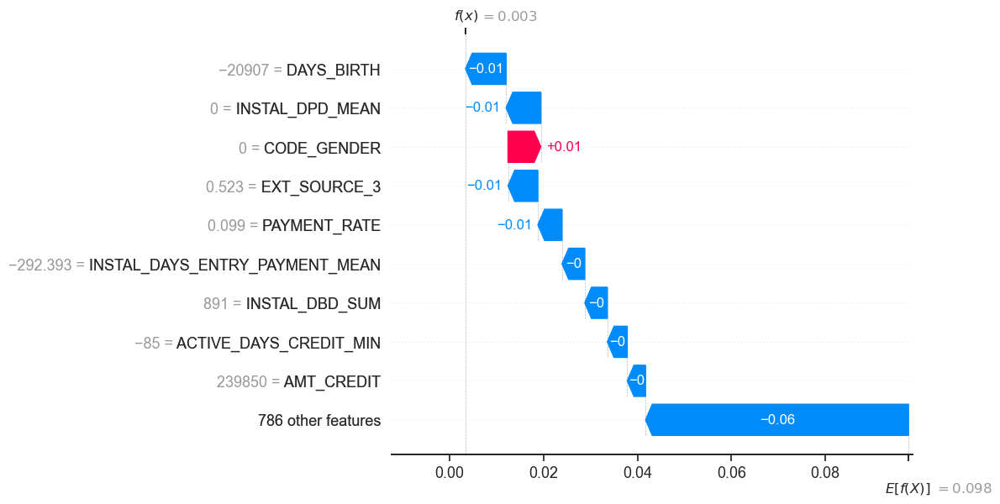

In [329]:
shap.plots.waterfall(shap_test[:,:][5])

In [330]:
shap.plots.force(shap_test[:,:][0])

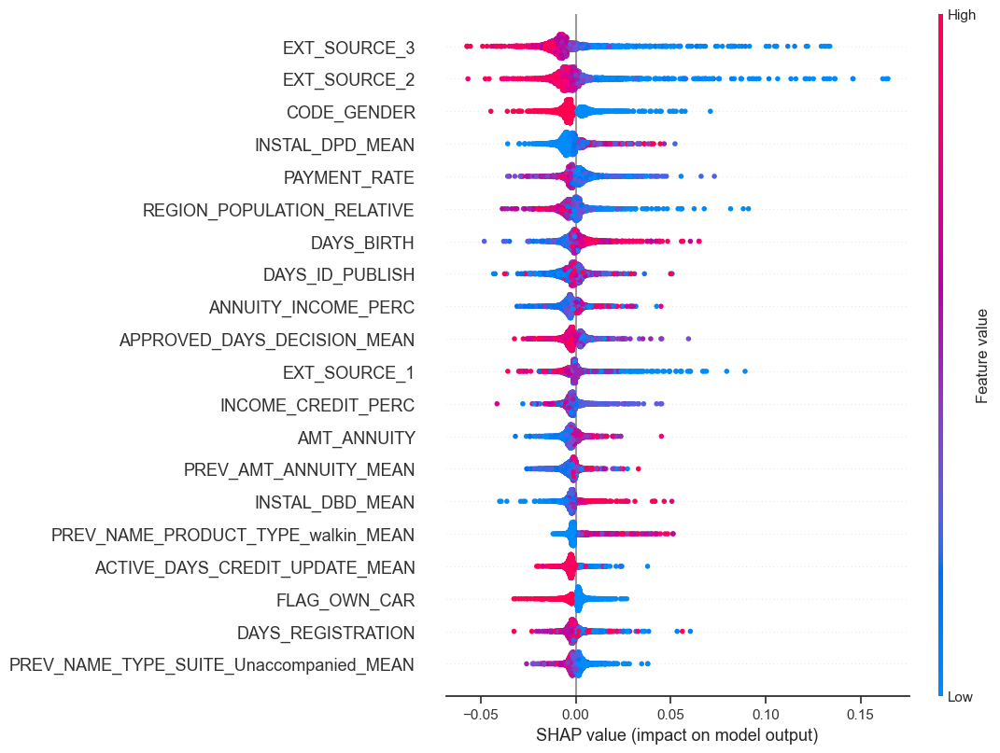

In [331]:
shap.summary_plot(shap_test, X_test)

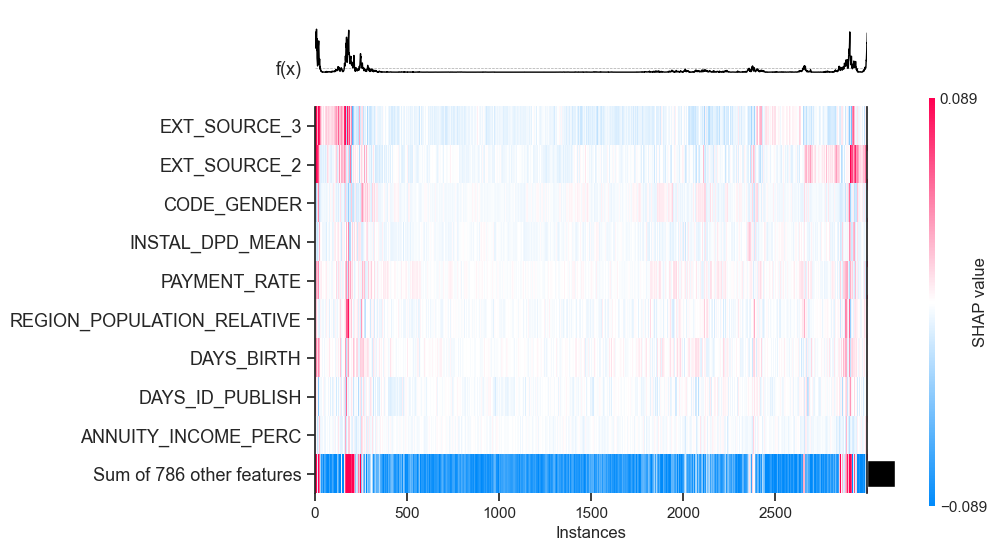

In [332]:
shap.plots.heatmap(shap_test)


Le diagramme de valeurs SHAP ci-dessus indique également comment chaque caractéristique impacte la variable dépendante

Les valeurs de Shap sont représentées pour chaque variable dans leur ordre d’importance, chaque point représente une valeur de Shap (pour un client), les points rouges représentent des valeurs élevées de la variable et les points bleus des valeurs basses de la variable.

- "Score normalisé à partir d'une source de données externe"
Plus la valeur du "Score normalisé à partir d'une source de données externe" est faible (points de couleur bleue), et plus la valeur Shap est élevée et donc plus le modèle prédit que le client aura des difficultés de paiement.

Nous pouvons obtenir un aperçu plus approfondi de l'effet de cette fonctionnalité sur l'ensemble de données avec un graphique de dépendance.

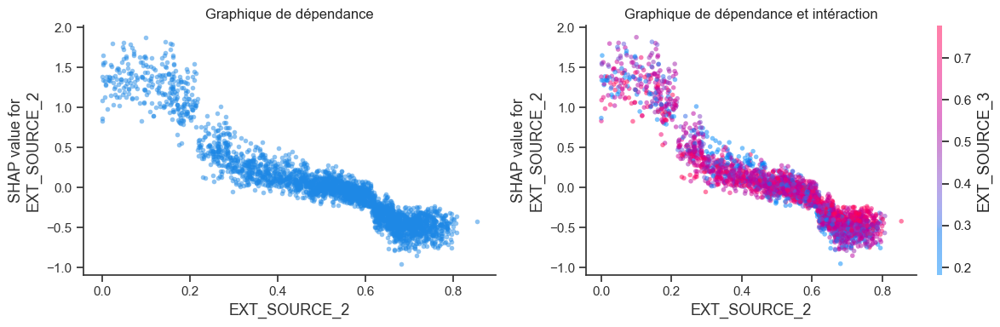

In [333]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("EXT_SOURCE_2", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("EXT_SOURCE_2", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et intéraction" )

plt.tight_layout()
plt.show()


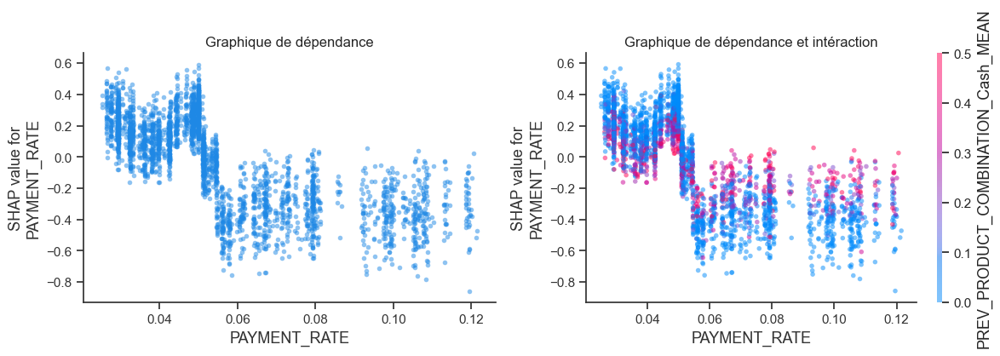

In [334]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("PAYMENT_RATE", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("PAYMENT_RATE", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et intéraction" )

plt.tight_layout()
plt.show()

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


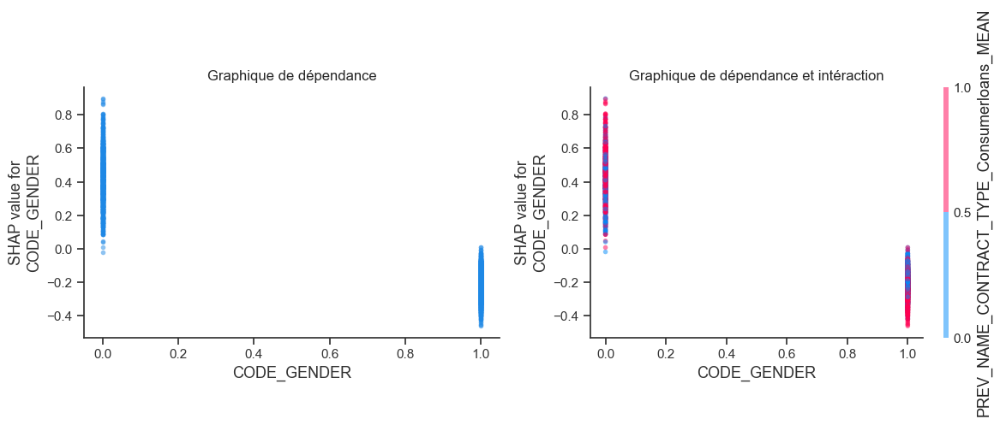

In [335]:
fig = plt.figure(figsize=(12,4))

ax1 = fig.add_subplot(121)
shap.dependence_plot("CODE_GENDER", shap_values[1], X_test, 
                     interaction_index=None, alpha = 0.5,
                     ax=ax1, show = False)
ax1.title.set_text("Graphique de dépendance" )

ax2 = fig.add_subplot(122)
shap.dependence_plot("CODE_GENDER", shap_values[1], X_test, 
                     interaction_index="auto", alpha = 0.5, 
                     ax=ax2, show = False)
ax2.title.set_text("Graphique de dépendance et intéraction" )

plt.tight_layout()
plt.show()

In [336]:
X_test['CODE_GENDER'].value_counts()


1.0    1991
0.0    1009
Name: CODE_GENDER, dtype: int64

In [337]:
explainer_shap = shap.TreeExplainer(rtr)
shap_values = explainer_shap.shap_values(X_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [348]:
shap.initjs()

idx = 800
print("Client numero : ", X_test.iloc[idx, 0])
print("Model Prediction : Classe", y_pred_lgbm[idx])
print(f"Il y a {y_pred_lgbm_proba[idx][1]:.1%} de risques que le client ait des difficultés de paiement")
print("__"*40)
shap.force_plot(explainer_shap.expected_value[1], 
                shap_values[1][idx,:], 
                X_test.iloc[idx,:], 
                link='logit',
                figsize=(20, 8),
                ordering_keys=True,
                text_rotation=0,
                contribution_threshold=0.05)

Client numero :  0.0
Model Prediction : Classe 0.0
Il y a 3.9% de risques que le client ait des difficultés de paiement
________________________________________________________________________________


Pour comprendre et interpréter visuellement les résutats du modèle localement, c'est-à-dire pour une instance (ici un client) il existe trois alternatives: force plot, decision plot et waterfall plot.

Pour une instance, ces trois représentations sont redondantes, elles représentent l’information de manière très similaire. En même temps, certains éléments de ces graphiques sont complémentaires. En mettant côte à côte les trois, on comprend d’une manière plus intuitive le résultat. 
- Le force plot est bon pour voir où se place le “output value” par rapport à la “base value”. Nous observons également quelles variables ont un impact positif (rouge) ou négatif (bleu) sur la prédiction et l’amplitude de cet impact. 
- Le water plot permet aussi de voir l’amplitude et la nature d’impact d’une variable avec sa quantification. Il permet de voir également l’ordre d’importance des variables et les valeurs prises par chacune des variables pour l’instance étudiée. 
- Le Decision plot permet d’observer l’amplitude de chaque changement, “une trajectoire” prise par une instance pour les valeurs des variables affichées.

On peut aussi représenter plusieurs instances en même temps avec le force plot et le decision plot.

Le force plot pour un ensemble d'instances peut être comparé au dernier niveau d’un dendrogramme. Les échantillons sont groupés par similarité ou par variable sélectionnée. Mais ce graphique est difficile à lire pour un échantillon aléatoire. Il est beaucoup plus parlant si nous représentons les cas contrastés ou avec une hypothèse derrière.

Le decision plot, pour un ensemble d’échantillons, devient vite encombrant si nous sélectionnons trop d’instances. Il est très utile pour observer ‘un écart de trajectoire’ ou des “trajectoires divergentes/convergentes” d’un groupe d’instances limité.

link : "identity" or "logit" ==> La transformation utilisée lors du dessin des étiquettes de graduation. L'utilisation de logit changera les numéros de log-odds en probabilités.

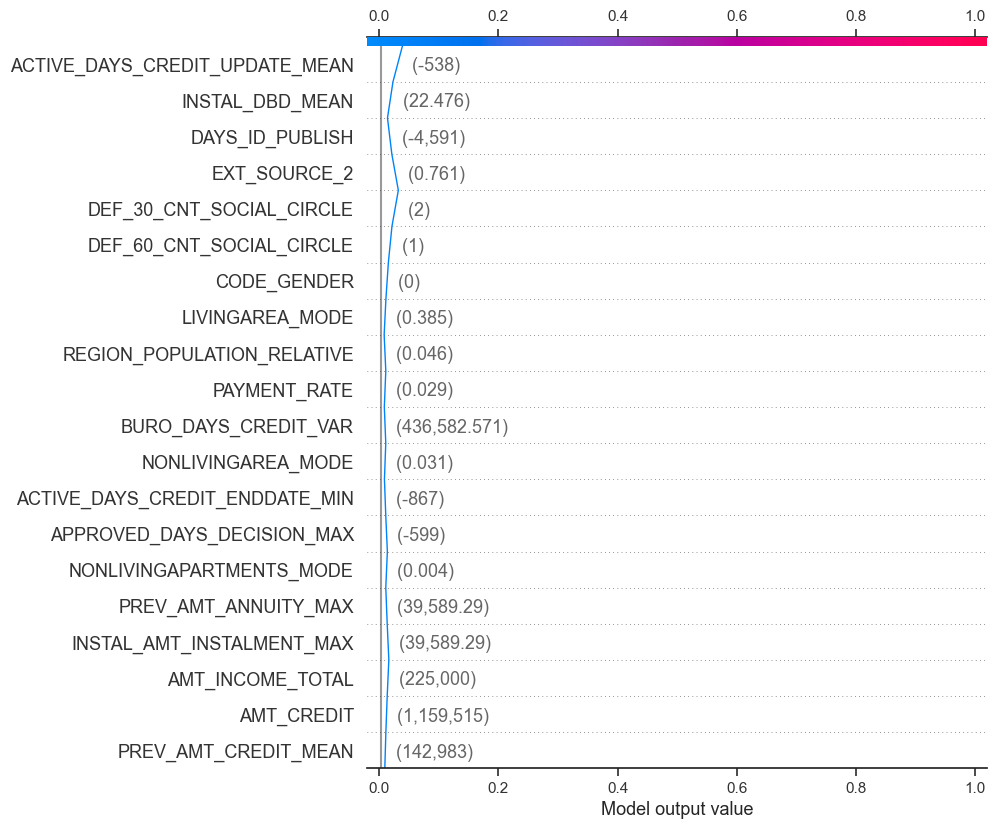

In [349]:
shap.decision_plot(explainer_shap.expected_value[1], 
                   shap_values[1][idx,:], 
                   X_test.iloc[idx,:], 
                   feature_names=X_test.columns.to_list(),
                   feature_order='importance',
                   link='logit')

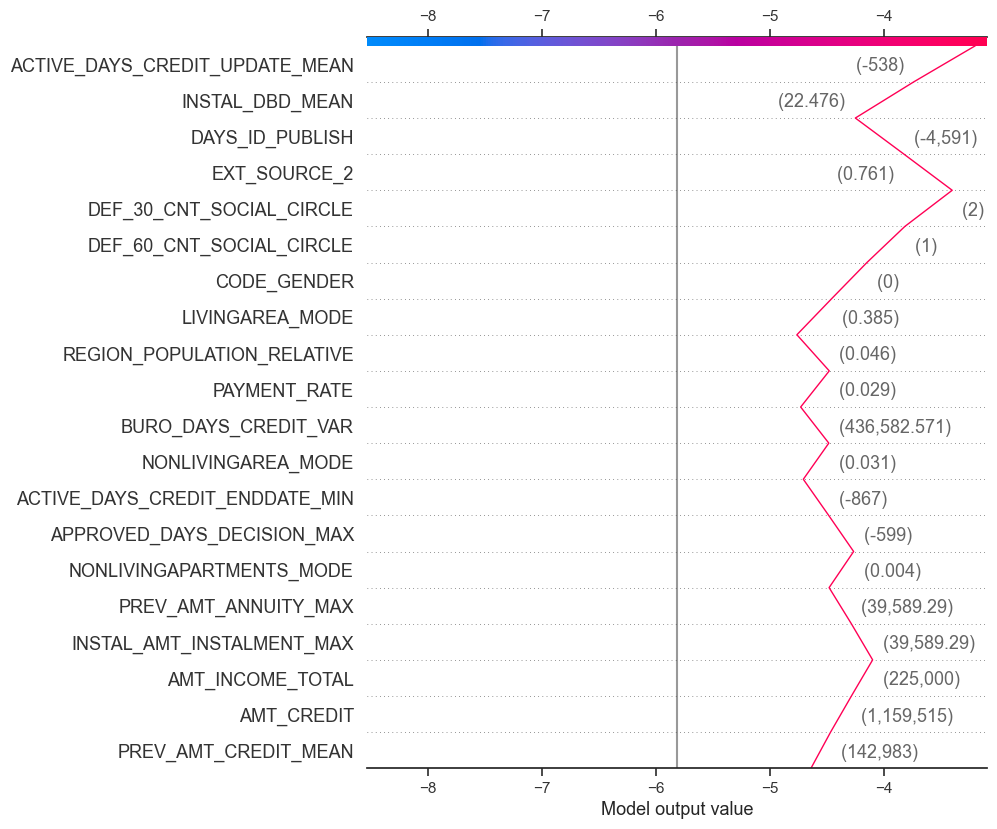

In [350]:
shap.decision_plot(explainer_shap.expected_value[1], 
                   shap_values[1][idx,:], 
                   X_test.iloc[idx,:], 
                   feature_names=X_test.columns.to_list(),
                   feature_order='importance',
                   link='identity')

In [352]:
df_groupes = pd.concat([y_pred_lgbm_proba_df['proba_classe_1'], shap_values_df], axis=1)
df_groupes.shape


(3000, 796)

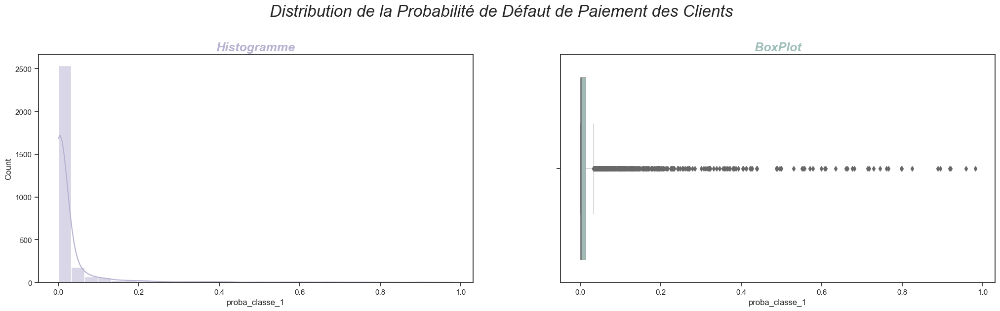

In [353]:
sns.set(style="ticks", rc={'figure.figsize': (25, 6)}, palette="rocket")

plt.subplot(1, 2, 1)
ax1 = sns.histplot(data=df_groupes, x='proba_classe_1',
                   color="#b5b1d0", kde=True, bins=30)
plt.title("Histogramme", loc="center", fontsize=18,
          fontstyle='italic', fontweight="bold", color="#b5b1d0")

plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data=df_groupes, x='proba_classe_1',
                  color="#9ebeb8", linewidth=0.5)
plt.title("BoxPlot", loc="center", fontsize=18,
          fontstyle='italic', fontweight="bold", color="#9ebeb8")

plt.suptitle("Distribution de la Probabilité de Défaut de Paiement des Clients\n",
             y=1.05, fontsize=24, fontstyle='italic')

plt.show()

In [354]:
df_groupes['typologie_clients'] = pd.qcut(df_groupes.proba_classe_1,
                                          q=5,
                                          precision=1,
                                          labels=['20%_et_moins',
                                                  '21%_30%',
                                                  '31%_40%',
                                                  '41%_60%',
                                                  '61%_et_plus']
                                          )
df_groupes['typologie_clients'].value_counts()

20%_et_moins    600
21%_30%         600
31%_40%         600
41%_60%         600
61%_et_plus     600
Name: typologie_clients, dtype: int64

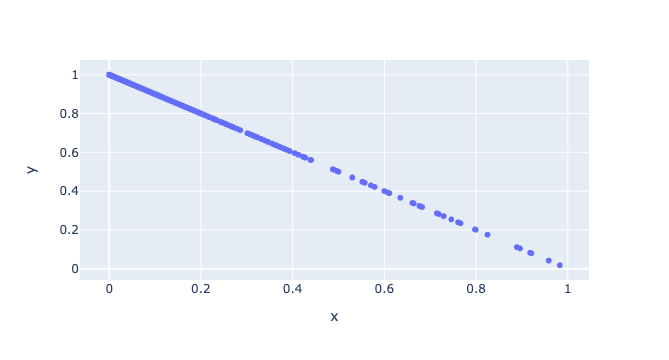

In [359]:
# x and y given as array_like objects
import plotly.express as px
fig = px.scatter(x=y_pred_lgbm_proba_df['proba_classe_1'], y=y_pred_lgbm_proba_df['proba_classe_0'])
fig.show()

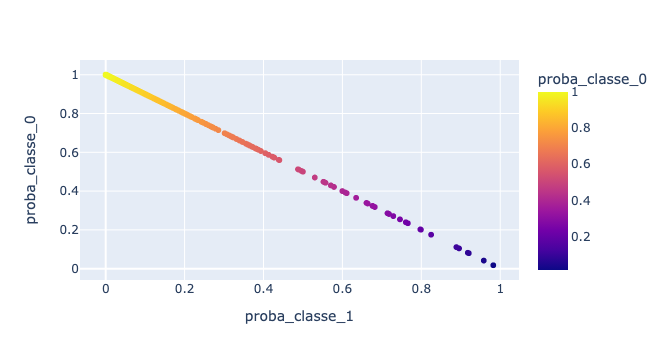

In [360]:
import plotly.express as px
df_2 = y_pred_lgbm_proba_df
fig = px.scatter(df_2, x="proba_classe_1", y="proba_classe_0", color='proba_classe_0')
fig.show()

In [15]:
df.sample(500).to_csv("X_test_original.csv", index=False)

In [184]:
X_train.sample(500).to_csv("X_test_clean.csv", index=False)